In [48]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [49]:
data = np.genfromtxt('data_ml2.txt', delimiter='\t')
X, y = data[:, :3], data[:, 3]
y = y.astype(np.int)

print('X.shape:', X.shape)
print('y.shape:', y.shape)
X_train = X
y_train = y
print("X_train:", X_train)
print("Y_train:",y_train)

X.shape: (16, 3)
y.shape: (16,)
X_train: [[3.  0.2 1. ]
 [1.  0.3 1. ]
 [4.  0.5 1. ]
 [2.  0.7 1. ]
 [0.  1.  1. ]
 [1.  1.2 1. ]
 [1.  1.7 1. ]
 [6.  0.2 1. ]
 [7.  0.3 1. ]
 [6.  0.7 1. ]
 [3.  1.1 1. ]
 [2.  1.5 1. ]
 [4.  1.7 1. ]
 [2.  1.9 1. ]
 [5.  1.  1. ]
 [3.  1.5 1. ]]
Y_train: [-1 -1 -1 -1 -1 -1 -1  1  1  1  1  1  1  1 -1 -1]


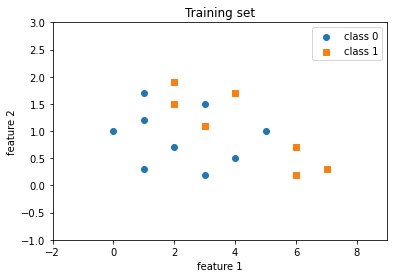

In [50]:
plt.scatter(X_train[y_train==-1, 0], X_train[y_train==-1, 1], label='class 0', marker='o')
plt.scatter(X_train[y_train==1, 0], X_train[y_train==1, 1], label='class 1', marker='s')
plt.title('Training set')
plt.xlabel('feature 1')
plt.ylabel('feature 2')
plt.xlim([-2, 9])
plt.ylim([-1, 3])
plt.legend()
plt.show()

In [51]:
class Pocket():
    def __init__(self, weight1, weight2, weight3, learning_rate ):
        self.weights = np.zeros((3, 1), dtype=np.float)
        self.weights [0][0] = weight1
        self.weights [1][0] = weight2
        self.weights [2][0] = weight3
        self.learning_rate = learning_rate

    def forward(self, x):
        linear = np.dot(x, self.weights)
        print("linear:",linear)
        predictions = np.where(linear > 0 , 1, -1)
        print("predictions:",predictions)
        return predictions
        
    def backward(self, x, y):  
        predictions = self.forward(x)
        errors = y - predictions
        return errors
    
    
    def train(self, x, y, epochs):
        best_weights = np.zeros((3, 1), dtype=np.float)
        minMisclassifications = 16
        num_misclassifications = []
        iterations = []
        for e in range(epochs):
            misclassifications = 0
            for i in range(y.shape[0]):
                print("\n X:",x[i])
                print("Y:",y[i])
                errors = self.backward(x[i].reshape(1, 3), y[i]).reshape(-1)
                print("weight1:\t",self.weights[0][0])
                print("weight2:\t",self.weights[1][0])
                print("weight3:\t",self.weights[2][0])
                print("errors:",errors)
                if errors != 0:
                    self.weights += (self.learning_rate* y[i] * x[i]).reshape(3, 1)
                    print("learning_rate* y[i] * x[i]:", self.learning_rate *y[i] * x[i])
                    misclassifications += 1
                else:
                    continue       
            iterations.append(self.weights)
            num_misclassifications.append(misclassifications)
            accuracy = (16 - misclassifications) / y.shape[0]
            print("accuracy", accuracy)
            if misclassifications<minMisclassifications:
                best_weights[0][0]= self.weights [0][0]
                best_weights[1][0]= self.weights [1][0]
                best_weights[2][0]= self.weights [2][0]
                minMisclassifications = misclassifications
            print("Misclassifications {}".format(misclassifications))
        print("weights of each iteration: ",iterations )
        print("number of misclassifications in each iteration: ",num_misclassifications)
        best_case = (16 - minMisclassifications) / y.shape[0]
        print("best case accuracy", best_case)
        print("best case weights: ")
        print("weight1:\t",best_weights[0][0])
        print("weight2:\t",best_weights[1][0])
        print("weight3:\t",best_weights[2][0])
    
                            

In [53]:
ppn = Pocket(weight1 = 1.0, weight2 =1.0 , weight3 = 1.0, learning_rate = 1)
ppn.train(X_train, y_train, epochs = 2000)


 X: [3.  0.2 1. ]
Y: -1
linear: [[4.2]]
predictions: [[1]]
weight1:	 1.0
weight2:	 1.0
weight3:	 1.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-1.76]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 0.8
weight3:	 0.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 0.8
weight3:	 0.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-3.44]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 0.8
weight3:	 0.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[0.8]]
predictions: [[1]]
weight1:	 -2.0
weight2:	 0.8
weight3:	 0.0
errors: [-2]
learning_rate* y[i] * x[i]: [-0. -1. -1.]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -0.19999999999999996
weight3:	 -1.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-3.34]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -0.19999999999999996
weight3:	 -1.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-13.04]]
predictions: [[-1

predictions: [[1]]
weight1:	 5.0
weight2:	 -3.4
weight3:	 -1.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.54]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -3.4
weight3:	 -1.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.6]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -3.4
weight3:	 -1.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.6]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -4.4
weight3:	 -2.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.88]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -4.4
weight3:	 -2.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.32]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -4.4
weight3:	 -2.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -4.4
weight3:	 -2.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.08]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -4.4
weight3:	 -2.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
l

predictions: [[1]]
weight1:	 6.0
weight2:	 -4.799999999999999
weight3:	 -1.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.799999999999999
weight3:	 -1.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.7]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.799999999999999
weight3:	 -2.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.799999999999999
weight3:	 -2.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-2.74]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.799999999999999
weight3:	 -2.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.799999999999999
weight3:	 -2.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.06]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.799999999999999
weight3:	 -2.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.8]]
pr

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[31.74]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[25.06]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[8.38]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.7]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[10.86]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[18.8]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -4.199999999999999
weight3:	 -2.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: 

weight3:	 -4.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-14.35]]
predictions: [[-1]]
weight1:	 -1.0
weight2:	 -5.499999999999999
weight3:	 -4.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-11.1]]
predictions: [[-1]]
weight1:	 -1.0
weight2:	 -5.499999999999999
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[30.41]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -5.299999999999999
weight3:	 -3.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[23.29]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -5.299999999999999
weight3:	 -3.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -5.299999999999999
weight3:	 -3.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 5.0
weight2:	 -5.299999999999999
weight3:	 -3.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.54]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -3.799999999

weight1:	 1.0
weight2:	 -5.199999999999998
weight3:	 -4.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.84]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.199999999999998
weight3:	 -4.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.96]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -5.199999999999998
weight3:	 -4.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[1.44]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -5.199999999999998
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-1.64]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.199999999999998
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[13.05]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.499999999999998
weight3:	 -3.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[4.25]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.499999999999998
weight3:	 -3.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.35]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.4999999999999


 X: [0. 1. 1.]
Y: -1
linear: [[-8.3]]
predictions: [[-1]]
weight1:	 -1.0
weight2:	 -3.2999999999999985
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.96]]
predictions: [[-1]]
weight1:	 -1.0
weight2:	 -3.2999999999999985
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.61]]
predictions: [[-1]]
weight1:	 -1.0
weight2:	 -3.2999999999999985
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-11.66]]
predictions: [[-1]]
weight1:	 -1.0
weight2:	 -3.2999999999999985
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[30.07]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -3.0999999999999983
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[23.83]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -3.0999999999999983
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.59]]
predictions: [[1]]
weight1:	 5.0
weight2:	 -3.0999999999999983
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
li

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.299999999999997
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.17]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.099999999999997
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.73]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.099999999999997
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.29]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.099999999999997
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.15]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.099999999999997
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.18]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.599999999999997
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.74]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.599999999999997
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1

weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999997
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999997
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999997
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999997
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999997
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999997
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	

errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999996
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999996
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999996
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999996
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999996
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999996
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999995
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999995
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999995
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999995
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999995
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999995
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999995
weight3:	 -6.0
error

predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999994
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999994
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999994
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999994
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999994
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999994
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999994
weight3:	 -5.0
errors: [0]

 

weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999993
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999993
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999932
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999932
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999932
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999993
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weig

weight1:	 1.0
weight2:	 -5.0999999999999925
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999999925
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999992
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999992
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999992
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999992
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999992
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999999


 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.8999999999999915
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	

learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999991
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999991
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999991
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999991
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999991
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999999
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999999
weight3:	 

weight1:	 2.0
weight2:	 -5.1999999999999895
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.1999999999999895
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.1999999999999895
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.1999999999999895
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999999895
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999999895
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999999895
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]


weight2:	 -6.199999999999989
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999989
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999989
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999989
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999999887
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999999887
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999999887
weight3:	 -4.0
erro

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999988
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999988
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999988
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999988
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999988
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999988
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999988
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: 

weight2:	 -6.399999999999987
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999987
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999987
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999987
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999987
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999987
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999987
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1

weight1:	 7.0
weight2:	 -4.199999999999986
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999986
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999986
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999986
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999986
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999986
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999986
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weig

weight1:	 -2.0
weight2:	 -6.399999999999985
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999985
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999985
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999985
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999985
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999985
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999985
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999984
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999984
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999984
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999984
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999984
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999984
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999984
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * 

linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999999834
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999999834
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999999834
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999836
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999836
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999836
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999836
we


 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999982
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999982
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999982
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999999822
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999999822
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999999822
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999982
weight3:	 -5.0
errors: [0]
a

predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999982
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999982
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999816
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999816
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999816
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999816
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999816
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight

linear: [[3.55271368e-15]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999999805
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999999805
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999999805
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999998
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999998
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999998
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999998
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
wei

predictions: [[1]]
weight1:	 6.0
weight2:	 -3.79999999999998
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.79999999999998
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.79999999999998
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.79999999999998
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999979
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999979
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999979
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predic

Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[4.4408921e-15]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999979
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
prediction

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999782
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999782
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999782
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999978
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999978
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999978
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999978
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54

linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[4.4408921e-15]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999977
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999976
weight3:	 -5.0
e

weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999975
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999975
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999975
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999975
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999975
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999975
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	

linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999974
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999974
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999974
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999974
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999974
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999974
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999974
weight3:	 -5.0
errors: [0]

 X: 

Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999973
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999973
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999973
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999973
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999973
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999973
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999973
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1

linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999972
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999972
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999972
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999972
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999972
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999972
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999972
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
li

weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999971
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999971
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999971
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999971
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999971
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999971
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999971
weight3:	 -4.0
errors: [0]

 X: [

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999997
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
pr

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999969
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999969
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999969
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999969
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999969
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999969
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999969
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
pr

weight1:	 7.0
weight2:	 -4.199999999999968
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999968
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999968
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999968
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999968
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999968
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999968
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weigh

errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999967
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999967
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999967
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999967
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999999674
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999999674
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.2

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999999662
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999999662
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999999662
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999966
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999966
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999966
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999966
weight3:	 -5.0
errors: [0]

 X: [2

linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999656
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999656
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999656
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999965
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999965
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999965
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999965
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: 

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999964
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999964
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999964
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999964
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999964
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999964
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999964
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linea

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999963
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999963
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999963
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999963
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999963
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999963
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
w

errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999962
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999962
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999962
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999962
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999962
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999962
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weigh

weight1:	 4.0
weight2:	 -5.399999999999961
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999961
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999961
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999961
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999613
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999613
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999613
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]

errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999961
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999961
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999996
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999996
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999996
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999996
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999996
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear:

weight1:	 6.0
weight2:	 -3.8999999999999595
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999595
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999595
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999595
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999595
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999595
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999999595
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predicti

linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999959
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1

predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999958
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999958
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999958
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999958
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999958
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999958
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999958
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 

errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999957
weight3:

weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999956
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999956
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999956
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999956
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999956
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999956
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1

Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999955
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999955
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999955
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999955
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999955
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999955
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999955
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1

weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999954
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999954
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999954
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999954
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999954
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999954
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999954
weight3:	 -4.0
errors: [-2]
learning_rate* y[i]

errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999953
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999953
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999953
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999953
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999953
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999953
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]

linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999952
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999952
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999952
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999952
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999952
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999952
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999952
weight3:	 -5.0
error

linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999514
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999514
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999514
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999514
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999514
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999514
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999951
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
li

linear: [[9.76996262e-15]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.99999999999995
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.99999999999995
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999995
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999995
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999995
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999995
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999995
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999949
weight3:	 -5.0
e

weight1:	 7.0
weight2:	 -4.299999999999948
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999948
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999948
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999948
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999948
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999948
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999948
weight3:	 -6.0
errors: [0]

 X: [0. 1. 

weight1:	 7.0
weight2:	 -4.099999999999947
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999947
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999947
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999947
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999947
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999947
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999947
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
we

weight1:	 4.0
weight2:	 -5.599999999999946
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999946
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999946
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999946
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999946
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999946
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999946
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
li

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999999455
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999999455
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999945
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999945
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999945
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999945
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999453
weight3:	 -4.0
err

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999945
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999945
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999945
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999945
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999945
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999945
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999945
weight3:	 -4.0
errors

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999944
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999944
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999944
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999944
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999944
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999944
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999944
weight3:	 -5.0


weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999943
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999943
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999943
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999943
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999943
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999943
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999943
w

predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999417
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999417
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999417
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999942
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999942
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999942
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999942
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999941
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999941
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999941
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999941
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999941
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999941
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999941
weight3:	 -6.0
error

weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999994
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999994
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999994
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999994
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999994
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999994
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.19999999999994
weight3:	 -

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999939
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999939
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999939
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999939
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999939
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999939
weight3:	 -5.0
errors: [0]

 X:

weight2:	 -5.499999999999938
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999938
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999938
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999938
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999938
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999938
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999938
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
p

linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999937
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999937
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999937
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999937
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999937
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999937
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999937
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1


weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999936
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999936
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999936
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999936
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999936
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999936
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999935
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999935
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999935
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999935
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999935
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999935
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -

errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999934
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999934
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999934
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999934
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999934
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999934
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999934
weight3:	 -5.0

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999933
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.

weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999932
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999932
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999932
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999932
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999932
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999932
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999932
weight3:	 -4.0
errors: [0]

 X: [

errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999931
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999931
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999931
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999931
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999931
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999931
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999931
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -

weight1:	 1.0
weight2:	 -5.09999999999993
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999993
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999993
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999993
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999993
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999993
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999993
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999993
weight3

weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999929
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999929
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999929
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999929
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999929
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999929
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999929
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 

weight1:	 -2.0
weight2:	 -6.399999999999928
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999928
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999928
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999928
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999928
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999928
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999928
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions

weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999927
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999927
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999927
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999927
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999927
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999927
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999999265
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999999265
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999267
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999267
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999267
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999267
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2

errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999926
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999926
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999926
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999925
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999925
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999925
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999925
weight3:	 -5.0
errors: [2]
learning_rate* y[i

linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999924
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999924
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999924
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999924
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999924
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999924
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999924
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
prediction

Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999923
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999923
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999923
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999923
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999923
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999923
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999923
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predicti

Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999922
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999922
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999922
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999922
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999922
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999922
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999922
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predic


 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999999215
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999921
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999921
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999921
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999921
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999921
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999921
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
pr

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999204
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999999204
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999992
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999992
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999992
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999992
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999992
weight3:	 -5.0
er

errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999999195
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999999195
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999999195
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999999195
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999999195
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.8999999999999195
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.8999999999999195
weight3:	 -5.

weight2:	 -4.899999999999919
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999999185
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999999185
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999999185
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999999185
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999999185
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.1999999999999185
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-

weight1:	 7.0
weight2:	 -4.899999999999918
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999918
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999918
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999918
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999918
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999918
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999918
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. 

weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999917
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999917
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999917
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999917
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999917
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999917
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1

linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999916
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999916
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999916
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999916
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999916
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999916
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	

weight2:	 -4.199999999999915
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999915
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999915
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999915
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999915
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999915
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999915
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1


linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999143
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999913
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999913
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999913
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999913
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999913
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999913
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999913
weight3:	 -5.0
errors: [0]

 X: [1.

weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999125
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999123
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999123
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999123
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999123
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999123
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999123
weight3:	 -4.0
errors: [0]

 X: [5. 1.

predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999911
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999911
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999911
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999911
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999911
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999911
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999911
weight3:	 -5.0
errors: [0]

 X: [4. 

predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999107
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999107
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999106
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999106
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999106
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999106
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999106
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weig

weight1:	 1.0
weight2:	 -4.999999999999909
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999909
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[1.77635684e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999909
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999909
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999909
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999909
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999909
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999

weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999908
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predicti

errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999908
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[1.86517468e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999908
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999908
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999908
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999075
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999075
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999075
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]

weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999907
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999907
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999907
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999907
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999907
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999907
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999

linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999906
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999906
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999906
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999906
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999906
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999906
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999906
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
line

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999905
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999905
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999905
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999905
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999905
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999905
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999905
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03

weight2:	 -3.7999999999999035
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999999035
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999036
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999036
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999036
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999036
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999999036
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weigh

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999902
weight3:	 -5.0
errors: [0]

 X

linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999017
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999017
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999017
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999999017
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999901
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999901
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999901
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999999
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.2999999999999
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.2999999999999
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]

Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999899
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999899
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999899
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999899
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999899
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999899
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999899
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1

weight1:	 2.0
weight2:	 -5.299999999999899
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999899
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999899
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999899
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999899
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999899
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999899
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predic

weight1:	 6.0
weight2:	 -3.799999999999898
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999898
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999898
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999898
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999898
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999898
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999898
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[

predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999897
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999897
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999897
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999897
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999897
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999897
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999897
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
pr

weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999896
weight3:	 -5.0
errors: [2]
learning_

linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999895
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999895
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999895
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999895
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999895
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999895
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999895
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
pre

weight2:	 -4.099999999999894
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999894
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999894
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999894
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999894
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999894
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999894
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
line

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999893
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999893
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999893
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999893
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999893
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999893
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999893
weight3:	 -5.0
e

weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999892
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999892
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999892
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999892
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999892
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999892
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999892
weight3:	 -5.0
errors: [0]

 X:

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999891
weight3:


 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.89999999999989
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999989
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999989
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999989
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999989
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999989
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999989
weight3:	 -5.0
errors: [0]

 X: [1

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999889
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999889
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999889
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999889
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999889
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999889
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:

weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999888
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999888
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999888
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999888
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999888
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999888
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999888
weig

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999888
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999888
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999887
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999887
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999887
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999887
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999887
weight3:	 -4.0
errors

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999998865
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999998865
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999886
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999886
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999886
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999886
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998863
weight3:	 -4.0
err

predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999886
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999886
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999886
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999886
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999886
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999886
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998857
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weigh

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998845
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998845
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[2.30926389e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999998845
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999998845
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998845
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999884
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999884
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:

weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998835
weight3:	 -5.0
errors: [2]
learning_rate* 

weight2:	 -5.299999999999883
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999883
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999883
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999883
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999883
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999883
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999883
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]


weight2:	 -4.0999999999998815
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.0999999999998815
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.0999999999998815
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.0999999999998815
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.0999999999998815
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999998815
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999998815
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1.

weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999881
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999881
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999881
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999881
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999881
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999881
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weig

errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.09999999999988
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999988
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999988
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999988
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999988
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999988
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.39999999999988
we

weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999879
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999879
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999879
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999879
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999879
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999879
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
we

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999878
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999878
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999878
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999878
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999878
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999878
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999877
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999877
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999877
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999877
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999877
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999877
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999877
weight3:	 -4.0
errors

weight1:	 2.0
weight2:	 -5.099999999999876
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999876
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999876
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999876
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999876
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999876
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999876
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predic

errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999875
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999875
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999875
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999875
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999875
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999875
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999875
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y:

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999874
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.3

weight1:	 -2.0
weight2:	 -6.399999999999873
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999873
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999873
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999873
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999873
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999873
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999873
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199

weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999872
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999872
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999872
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999872
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999872
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999872
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	

linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998717
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[

errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[2.57571742e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.99999999999987
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999869
weight3:	 -5.0
e

Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999868
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999868
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999868
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999868
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999868
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999868
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999868
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1.

linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999867
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999867
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999867
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999867
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999867
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999867
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999867
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X

weight1:	 1.0
weight2:	 -5.099999999999866
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999866
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999866
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999866
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999866
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999866
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999866
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999


 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999865
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
we

Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.8999999999998645
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.8999999999998645
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998645
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998645
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998645
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998645
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998645
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6. 

weight2:	 -4.199999999999863
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999863
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999863
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999863
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999863
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999863
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999863
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1



 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999998626
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999998626
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999998626
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998628
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998628
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998628
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 


 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998614
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998614
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998614
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998614
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998614
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998614
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998614
weight3:	 -5.0
errors: [0]


weight1:	 6.0
weight2:	 -3.799999999999861
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999861
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999861
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999861
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999986
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999986
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999986
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weig

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999986
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999998595
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999998595
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999998595
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999998595
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999998595
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.2999999999998595
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2



predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999859
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999858
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999858
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999858
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999858
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999858
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999858
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [

predictions: [[1]]
weight1:	 4.0
weight2:	 -5.5999999999998575
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.5999999999998575
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.5999999999998575
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.5999999999998575
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999998575
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999998575
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999998575
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999998565
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999998565
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999998565
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.3999999999998565
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999998565
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999998565
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999998565
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999856
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
pre

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999855
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999855
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999998545
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999998545
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999998545
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999998545
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999998545
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]


predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999854
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999854
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999854
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999854
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999854
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999854
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999854
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1.

linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999853
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999853
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999853
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999853
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999853
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999853
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999853
weigh

weight1:	 2.0
weight2:	 -5.899999999999852
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999852
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999852
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999852
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999852
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999852
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999852
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight

linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999851
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999851
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999851
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999851
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999851
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999851
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999851
weight3:	 -5.0
errors: [0]

 X: [


 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999985
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999985
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999985
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999985
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999985
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999985
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999985
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3

weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999849
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999849
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999849
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999849
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999849
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999849
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999849
weight3:	 -5.0
errors: [0]

 X:

linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998486
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998486
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998484
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998484
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998484
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998484
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998484
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]


linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999847
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.01980663e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999847
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999847
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999847
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999847
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999847
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999847
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]

linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999846
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999846
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999846
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999846
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999846
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999846
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999846
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999845
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999845
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999845
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999845
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999845
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999845
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999845
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 

weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999844
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999844
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999844
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999844
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999844
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999844
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predicti

linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999843
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999

weight2:	 -3.8999999999998423
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999842
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999842
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999842
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999842
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999842
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999842
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999841
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999841
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999841
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999841
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999841
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999841
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
w

linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999984
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999984
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.19999999999984
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999984
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999984
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999984
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999984
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions

linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999998395
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999998395
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999998395
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998397
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998397
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998397
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998397
we

linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998384
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999838
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999838
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999838
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999838
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999838
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999838
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
lin

weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999837
weight3

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999836
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999836
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999836
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999836
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999836
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999836
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999836
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y:

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999835
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999835
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999835
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999835
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999835
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999835
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999835
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
w

predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999834
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999834
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999834
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999834
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999834
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999834
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999834
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]


weight1:	 6.0
weight2:	 -3.8999999999998334
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999833
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999833
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999833
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999833
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999833
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999833
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [

errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.8999999999998325
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.8999999999998325
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.8999999999998325
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998325
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998325
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998325
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999831
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999831
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999831
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999831
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999831
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999831
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999831
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1

weight1:	 3.0
weight2:	 -3.7999999999998306
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999998306
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999831
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999831
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999831
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999831
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999831
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-

predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.4999999999998295
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998295
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998295
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999998295
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998295
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998295
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998295
weight3:	 -5.0
errors: [0]

 

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999829
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999829
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999829
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999829
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999829
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999829
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999829
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[2

weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.46389584e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999828
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999998275
wei

weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999827
weight3:	 -5.0
errors: [0]

 X: [6. 

weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999826
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999826
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999826
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999826
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999826
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999826
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.7

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999825
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999825
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999825
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999825
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999825
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999825
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
w

linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999824
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999824
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999824
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999824
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999824
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999824
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999824
weight3:	 -5.0
errors: [0]

 X: 

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999823
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999823
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999823
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999823
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999823
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999823
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999823
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
pr

weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999822
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999822
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999822
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999822
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999822
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999822
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999822
weight3:	 -5.0
errors: [2]
lear

linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999821
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999821
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999821
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999821
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999821
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999821
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999821
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
we

weight1:	 2.0
weight2:	 -5.29999999999982
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.79999999999982
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.79999999999982
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.79999999999982
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.79999999999982
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.79999999999982
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.59999999999982
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predic

linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999819
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999819
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999819
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999819
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999819
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999819
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999819
weight3:	 -5.0
errors: [0]

 X: 

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999998185
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999817
weight3:	 -5

linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.8999999999998165
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.8999999999998165
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998165
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998165
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998165
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998165
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999998165
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999815
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999815
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999815
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999815
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999815
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999815
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999815
weight3:	

errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999815
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999815
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999815
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999815
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999815
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999815
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999998146
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
lin

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.73034936e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999998135
wei


 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999812
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999812
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999812
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999812
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999812
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999812
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999812
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]

learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.7999999999998115
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.7999999999998115
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.7999999999998115
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.7999999999998115
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.7999999999998115
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999811
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999811
wei

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999998105
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999998105
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999998105
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999998105
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.39999999999981
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.39999999999981
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.39999999999981
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	

weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999981
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999809
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999809
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999809
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999809
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999809
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999809
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]


predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999998085
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999998085
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.8999999999998085
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.8999999999998085
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999998085
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999808
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999808
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
we

weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999808
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999808
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999808
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999807
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999807
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999807
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999807
weight3:	 -5.0
errors: [2]
lear


 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999998066
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999998066
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999998066
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999998066
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999806
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999806
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999806
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
lin

errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999806
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999806
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999806
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999806
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999806
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999806
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999

errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999805
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999805
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999805
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999805
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999805
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999805
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999804
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999804
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999804
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999804
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999804
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999804
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999804
weight3:	 -3.0
errors: [-2]
le

weight1:	 -2.0
weight2:	 -5.699999999999803
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999803
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999803
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999803
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999803
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999803
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999803
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.49

weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998024
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998024
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998024
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998024
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999998024
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999802
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999802
weight3:	 -4.0
errors: [0]

 X: [3.

predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999801
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999801
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999801
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999801
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999801
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999801
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999801
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
pre

errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999998
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999799
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999799
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999799
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999799
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999799
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999799
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999799
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linea

errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999798
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999798
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999798
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999798
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999798
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999798
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999798


linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999797
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999796
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999796
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999796
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999796
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999796
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999796
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: 

predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999796
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999796
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999796
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999997955
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999997955
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999997955
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999997955
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -


 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999795
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
we

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999794
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999794
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999794
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999794
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999794
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999794
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999794
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y:

weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999793
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999793
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999793
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999793
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999793
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999793
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999793
weight3:	 -6.0
error

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999792
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999792
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999792
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999792
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999792
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999792
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999792
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999791
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999791
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999791
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999791
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999791
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999791
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999791
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]


predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999979
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999979
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999979
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999979
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999979
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999979
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999979
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
wei

weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999789
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999789
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999789
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999789
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999789
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999789
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999

predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999788
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999788
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999788
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999788
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999788
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999788
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999788
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:

weight2:	 -4.999999999999787
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[4.26325641e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999787
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999787
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999787
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999787
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999787
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999787
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999787
weight3

weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999786
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999786
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999786
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999786
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999786
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999786
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999786


predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999785
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999785
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999785
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999785
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999785
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999785
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999785
weight3:	 -5.0
errors: [0]

 

predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999784
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999784
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999784
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997836
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997836
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997836
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999784
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: 


 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999783
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999783
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999783
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999783
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999783
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999783
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999783
weight3:	 -5.0
errors: [-2]
l

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999782
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999782
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999782
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999782
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999782
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999782
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
wei

learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999781
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999781
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999781
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999781
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999781
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999781
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predicti

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.99999999999978
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999

errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999779
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1


linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999778
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999778
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999778
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999778
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999778
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999778
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999778
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
line

weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999777
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999777
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999777
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999777
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999777
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999777
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight

errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999776
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999776
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999776
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999776
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999776
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999776
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weigh

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997748
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997748
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997748
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999775
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999775
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999775
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4

Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999774
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999774
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999774
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999774
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999774
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999774
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999977

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999773
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999773
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999773
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999773
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999773
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999773
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999773
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
pred

linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999772
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999772
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999772
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999772
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999772
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999772
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999771
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
pre


 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997702
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997702
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997702
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997702
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999977
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999977
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.79999999999977
weight3:	 -5.0
errors: [0]

 X

linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999769
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999769
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999769
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[4.61852778e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999769
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999769
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999769
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999769
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999768
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weig

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997667
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997667
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997667
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997667
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997667
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997667
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999766
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassific

errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999765
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999765
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999765
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999765
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999765
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999765
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999765
weight3:	 -5.0
err

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999764
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999764
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999764
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999764
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999764
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999764
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -

weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999763
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999763
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999763
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999763
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999763
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999763
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999763

weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999762
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997623
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997623
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997623
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999762
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999762
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
w

weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999761
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999761
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999761
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999761
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999761
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999761
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predicti

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999976
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999976
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999976
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.19999999999976
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999976
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999976
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999976
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17

learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997597
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [

linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[4.79616347e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999758
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999

linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999757
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.79999999999975

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999997565
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999997565
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.2999999999997565
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.2999999999997565
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.2999999999997565
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.2999999999997565
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.06]]
predictions: [[-1]]
weigh

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999755
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999755
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999755
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999755
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999755
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999755
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:

weight2:	 -4.0999999999997545
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999997545
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997545
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997545
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997545
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997545
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997545
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight

weight1:	 6.0
weight2:	 -3.8999999999997534
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997534
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997534
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999753
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999753
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999753
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999753
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999753
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997526
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997526
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997526
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997526
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997526
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997526
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight

weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999752
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999752
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999752
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999752
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999752
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999752
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999997515
weight3:	 -4.0
errors: [0]

 X: [2.  1

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999751
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999751
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999751
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999751
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999751
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999751
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999751
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y:

weight1:	 2.0
weight2:	 -5.19999999999975
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.19999999999975
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.19999999999975
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999975
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999975
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999975
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999975
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6

Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999749
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999749
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999749
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999749
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999749
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999749
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999749
weig

errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999748
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997478
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997478
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997478
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999748
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999748
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:

Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999747
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weig

predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999746
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999746
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999746
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999746
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999746
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999746
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999746
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
pr

weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999745
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999745
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999745
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999745
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999745
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999745
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999745


predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999744
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999744
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999744
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999744
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999744
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999744
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999744
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
pr

linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999743
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999743
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999743
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999743
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999743
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999743
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999743


predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999742
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999742
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999742
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999742
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999742
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999742
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999742
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]


 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999741
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999741
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999741
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999741
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999741
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999741
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999741
weight3:

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999974
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999974
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999974
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999974
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999974
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999974
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999974
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999739
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999739
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999739
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999739
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999739
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999739
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
w

predictions: [[1]]
weight1:	 4.0
weight2:	 -5.5999999999997385
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.5999999999997385
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.5999999999997385
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.5999999999997385
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999997385
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999997385
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.0999999999997385
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.

weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999738
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999738
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999738
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999738
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999738
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999738
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999738
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y

learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999737
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999737
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999737
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999737
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999737
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999737
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999

weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997365
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997365
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999736
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999736
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999736
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999736
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.7999999999997

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[5.32907052e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999735
weight3

errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999735
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999735
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999735
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999735
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997347
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997347
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999997347
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
lin

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.4999999999997335
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.4999999999997335
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.4999999999997335
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.4999999999997335
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997335
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997335
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997335
weight3:	 -4.0
errors: [-2

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999733
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999733
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999733
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999733
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999733
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999733
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predic

Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999732
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999732
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999732
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999732
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999732
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999732
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999732
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. 

weight2:	 -6.399999999999731
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999731
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999731
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999731
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999731
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999731
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999731
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1

errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.89999999999973
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999973
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999973
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999973
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999973
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999973
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999973
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999973
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999973
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999973
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997295
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997295
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997295
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.8999999999997295
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
wei

linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999729
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999729
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999729
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999729
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999729
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999729
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999729
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 

weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999728
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999728
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999728
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999728
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999728
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999728
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999728
weight3:	 -5.0
errors: [2]
lear

errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999727
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999727
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999727
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999727
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999727
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999727
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.39999999999

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999726
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999726
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999726
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999726
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999726
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999726
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999726
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
w


 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999725
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999724
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999724
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999724
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999724
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999724
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999724
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999724
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:

errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999723
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999723
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999723
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999723
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999723
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999723
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999997232
weight3

weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997225
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997225
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999997225
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999722
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999722
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999722
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999722
weight3:	 -4.0
errors: [0]

 X: 

linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999997215
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.8999999999997215
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.8999999999997215
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.8999999999997215
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999721
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999721
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999721
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
we

accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999721
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999721
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999721
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999721
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999721
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999721
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999721
weight3:	 -6

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999997195
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999997195
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999997195
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999997195
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999997195
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.1999999999997195
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.1999999999997195
weight3:	 -5.0
errors: [0]



weight2:	 -6.399999999999719
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999719
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999719
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999719
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999719
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999719
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999719
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[


 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999718
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999718
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999718
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999718
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999718
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999718
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999718
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2

weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999717
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999717
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999717
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999717
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999717
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999717
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999717
weight3:	 -4.0
errors: [0]

 X: [6.  0.7

Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999716
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999716
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999716
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999716
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999716
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999716
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999716
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1

Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997153
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999997153
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999715
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999715
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999715
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999715
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999715
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]

linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[5.68434189e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999714
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999713
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999713
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999713
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999713
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999713
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999713
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999713
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999712
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999712
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999712
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999712
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999712
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999712
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999712
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 

weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999711
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999711
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999711
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999711
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999711
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999711
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999711
weight3:	 -6.0
error

predictions: [[1]]
weight1:	 6.0
weight2:	 -4.09999999999971
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999971
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999971
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999971
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999971
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999971
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999971
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
p

predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999709
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999709
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999709
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999709
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999709
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999709
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999709
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.

Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999708
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999708
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999708
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999708
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999708
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999708
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999708
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
prediction

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999707
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999706
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999706
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999706
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999706
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999706
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999706
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999705
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999705
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999705
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999705
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999705
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999705
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999705
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
pred

predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999704
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999704
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999704
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199999999999704
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999704
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999704
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999997045
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]


linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999997035
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999703
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999703
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999703
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999703
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997033
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997033
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -

predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999703
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999997027
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999997027
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999997027
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999703
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999703
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	

weight1:	 -2.0
weight2:	 -5.699999999999702
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999702
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999702
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999702
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999702
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999702
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999702
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499

linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999701
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999701
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999701
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999701
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999701
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999701
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999701
weight3:	

weight1:	 -2.0
weight2:	 -5.6999999999997
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.6999999999997
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.4999999999997
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.4999999999997
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.4999999999997
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.4999999999997
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999997
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999699
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999699
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999699
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999699
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999699
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996994
weight3:	 -5.0
errors: [0]

 X

weight2:	 -5.199999999999698
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999698
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999698
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999698
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999698
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999698
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999698
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [

linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999996974
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999996974
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999996974
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996976
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996976
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996976
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996976
we

weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999996962
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999696
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999696
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999696
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999696
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999696
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999696
weight

predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996956
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996956
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999695
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999695
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.44]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999695
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.4]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999695
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999695
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]

weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999694
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999694
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999694
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999694
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999694
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999694
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999694
wei

Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999693
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999693
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999693
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999693
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999693
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999693
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999

Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999692
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999692
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999692
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999692
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999692
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999692
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999692
weight3:	 


 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999996914
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999996914
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999996914
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999996914
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.5999999999996914
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999691
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999691
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y:

predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999691
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999691
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999691
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999691
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999691
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999691
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999691
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10

Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999969
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999969
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999996895
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999996895
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999996895
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.3999999999996895
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996895
weight3:	 -4.0
errors: [0]

 X: [2. 

weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999689
weight3:	 -5.0
errors: [0]

 X: [6.

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999688
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999688
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999688
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999688
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999688
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999688
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999688
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999687
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999687
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999687
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999687
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999687
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999687
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999687
weight3:	 -4.

linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999686
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999686
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999686
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999686
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999686
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999686
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999686
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
pre

predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999685
weight3:

weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999684
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999684
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999684
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999684
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999684
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999684
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999684
w

weight1:	 7.0
weight2:	 -4.899999999999683
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999683
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999683
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999683
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999683
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999683
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999683
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weigh

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999682
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999682
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999682
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999682
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999682
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999682
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999682
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999996815
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999996815
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999996815
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.3999999999996815
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999681
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999681
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999681
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight

weight2:	 -5.69999999999968
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999968
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999968
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.69999999999968
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.49999999999968
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.49999999999968
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.49999999999968
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.49999999999968
weight3:	

errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.99999999999968
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.99999999999968
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.99999999999968
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.99999999999968
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.99999999999968
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.99999999999968
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996796
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [

errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999996785
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999996785
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999996785
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999996785
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999996785
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999996785
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.9999999999996785
weight3:	 -5.0


weight1:	 6.0
weight2:	 -3.799999999999678
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999678
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999678
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999678
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999678
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999678
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999677
weight3:	 -5.0
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.96]]
predictions: [[-1]]
weight1

linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999677
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[6.48370246e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999677
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999677
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999677
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999996765
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999996765
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.2999999999996765
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999676
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999676
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999676
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999676
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999676
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.0999999999996755
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.0999999999996755
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weig

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999675
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999675
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999675
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999675
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999675
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999675
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999675
weight3:	 -4.0
errors: [-2]
lea

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999674
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999996735
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999996735
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.3999999999996735
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.3999999999996735
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996735
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996735
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.

weight1:	 1.0
weight2:	 -5.099999999999673
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999673
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999673
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999673
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999673
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999673
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999673
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999

weight1:	 1.0
weight2:	 -4.899999999999672
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999672
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999672
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999672
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999996716
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999996716
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.1999999999996716
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999671

weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999671
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999671


weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.89999999999967
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.89999999999967
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999967
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999967
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999967
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999967
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999967
weight

errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999669
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999669
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999669
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999669
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999669
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999669
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999669
weight3:	 -5.0
error

linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999668
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999966

weight1:	 1.0
weight2:	 -5.0999999999996675
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999996675
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.0999999999996675
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999667
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999667
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999667
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999667
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999

predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999667
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999667
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999667
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999667
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999667
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999667
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999666
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 

predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999666
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999666
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999666
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999666
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999666
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999666
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999666
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996646
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996646
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999665
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999665
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999665
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999665
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999665
weight3:	 -5.0
errors: [0

Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999664
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999664
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999664
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999664
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999664
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999664
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999966

Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999663
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999663
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999663
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999663
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999663
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999663
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999663
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999662
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999662
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999662
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999662
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999662
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999662
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999662
weight3:	 -5.0
errors: [0]

 X:

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999661
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
wei

learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-14.48]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999966
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999966
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999966
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999966
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.39999999999966
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999966
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.19999999999966
weight3:	 -5.0


 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999659
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999659
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999659
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.14]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999659
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999659
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999659
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999659
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: 

predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996585
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996585
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996585
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996585
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996583
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996583
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996583
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0


weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999657
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[6.83897383e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999657
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999657
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999657
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999657
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999657
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999657
weight3:	 -4.0
errors: [0]

 X: [

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999656
weight3:	 -5.0
e

linear: [[-14.06]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999655
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999655
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999655
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999655
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999655
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999655
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999655
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
prediction

linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999654
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999654
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999654
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999654
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999654
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999654
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999654
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999653
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999653
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999653
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999653
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999653
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999653
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999653
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predic

weight2:	 -4.199999999999652
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999652
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999652
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999652
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999652
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999652
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999652
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weig

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999651
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999651
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999651
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999651
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999651
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999651
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999651
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
pred

predictions: [[1]]
weight1:	 1.0
weight2:	 -4.89999999999965
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.89999999999965
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999965
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999965
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999965
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999965
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.19999999999965
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
prediction

predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999649
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999649
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999649
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999649
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999649
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999649
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999649
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999648
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999648
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.96]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999648
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.86]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999648
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.16]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.799999999999648
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.32]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999648
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.08]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.599999999999648
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.84]]
predictions: [[1]]
weight1:	 

weight1:	 2.0
weight2:	 -5.099999999999647
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999647
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999647
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999647
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999647
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999647
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999647
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predic

linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999646
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions:

weight1:	 1.0
weight2:	 -4.899999999999645
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999645
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999645
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999645
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999645
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999645
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999645
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999645
we

weight1:	 -2.0
weight2:	 -6.399999999999644
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999644
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999644
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999644
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999644
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999644
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999644
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -6.199

predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999643
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.35]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999643
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.15]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999643
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.95]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999643
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999643
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999643
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.999999999999643
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
pred

linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.7999999999996423
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.2]]
predictions: [[-1]]
we

linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999641
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999641
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.299999999999641
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999641
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999641
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.299999999999641
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.35]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.299999999999641
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i

weight1:	 2.0
weight2:	 -5.09999999999964
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.09999999999964
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.09999999999964
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999964
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999964
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999964
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.59999999999964
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.

weight2:	 -5.099999999999639
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999639
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999639
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999639
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999639
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999639
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999639
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999639
weight

weight1:	 1.0
weight2:	 -4.899999999999638
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999638
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999638
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999638
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.38]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999638
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999638
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.86]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999638
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999638
we

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999637
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999637
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999637
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999637
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999637
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999637
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999637
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predic

predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999636
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999636
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999636
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999636
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999636
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999636
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999636
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
p

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999635
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999635
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999635
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999635
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999635
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999635
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999635
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassificatio

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996344
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996344
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999634
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999634
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999634
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999634
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999634
weight3:	 -5.0
errors: [0

predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999633
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999633
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999633
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999633
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999633
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999633
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999633
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 


 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999632
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999632
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999632
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999632
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999632
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999632
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999632
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear:

learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999631
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999631
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999631
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999631
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999631
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.38]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999631
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999631
weight3:


 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999963
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999963
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999963
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999963
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999963
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.09999999999963
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.89999999999963
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.5

 X: [6.  0.7 1. ]
Y: 1
linear: [[15.22]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999629
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[1.06]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -5.399999999999629
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999629
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999629
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999629
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.899999999999629
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999629
weight3:	 -5.0
errors: [0]
ac

weight2:	 -5.099999999999628
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999628
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999628
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[43.53]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999628
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[34.57]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999628
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.61]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999628
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.65]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999628
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.67]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999628
weight3:	

Y: 1
linear: [[-5.1]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.399999999999627
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.37]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996273
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.59]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996273
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.1]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.8999999999996273
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.35]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999627
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-2.98]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999627
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.47]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999627
weig

predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999626
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999626
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.1]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.899999999999626
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999626
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.18]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999626
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.77]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.899999999999626
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.05]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.899999999999626
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. 

weight2:	 -4.199999999999625
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.02]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999625
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.199999999999625
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999625
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999625
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999625
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999625
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: 

linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.6999999999996245
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.7999999999996246
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.7999999999996246
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.7999999999996246
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996247
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996247
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
we

predictions: [[1]]
weight1:	 4.0
weight2:	 -5.499999999999623
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-5.25]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.499999999999623
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.2]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999996234
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999996234
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[22.]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.9999999999996234
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999623
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999623
weight3:	 -5.0
errors: [0]

 X: [1

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999623
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.999999999999623
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[36.86]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999623
weight3:	 -4.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[29.34]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999623
weight3:	 -4.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.82]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999623
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.3]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999623
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.54]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -3.799999999999623
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.78]]
pr

linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[7.54951657e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999622
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.27]]
predictions: [[

weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.8]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.76]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.16]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.04]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.56]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[-2.36]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.799999999999621
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  


 X: [2.  1.5 1. ]
Y: 1
linear: [[3.55]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999962
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[16.69]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999962
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.83]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999962
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.7]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.29999999999962
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.95]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.29999999999962
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.06]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.29999999999962
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.59]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.29999999999962
weight3:	 -5.0
errors: [0]

 X: [4.  

learning_rate* y[i] * x[i]: [6.  0.7 1. ]

 X: [3.  1.1 1. ]
Y: 1
linear: [[12.49]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999619
weight3:	 -4.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.85]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999619
weight3:	 -4.0
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[17.03]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999619
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[2.21]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999619
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 7.0
weight2:	 -4.099999999999619
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-6.65]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999619
weight3:	 -5.0
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.02]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999

linear: [[-5.4]]
predictions: [[-1]]
weight1:	 4.0
weight2:	 -5.599999999999618
weight3:	 -5.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[13.03]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999618
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.21]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999618
weight3:	 -4.0
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[21.9]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.099999999999618
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.65]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999618
weight3:	 -5.0
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999618
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999618
weight3:	 -5

predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999617
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.53]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.099999999999617
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.45]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.099999999999617
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.92]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999617
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999617
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.72]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999617
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.52]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.599999999999617
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.12]]
predictions: [[-1]]
w

accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.02]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.53]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.55]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.57]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.1]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.12]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.67]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -5.099999999999616
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-

predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.45]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.43]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.88]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.33]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[0.02]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.899999999999615
weight3:	 -5.0


Y: -1
linear: [[-12.4]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999614
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-15.68]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999614
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-18.88]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999614
weight3:	 -6.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-19.28]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -6.399999999999614
weight3:	 -6.0
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[21.14]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999614
weight3:	 -5.0
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[14.66]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999614
weight3:	 -5.0
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[0.18]]
predictions: [[1]]
weight1:	 4.0
weight2:	 -6.199999999999614
weight3:	 -5.0
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-6.3]]
predic

accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.04]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999613
weight3:	 -5.0
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.56]]
predictions: [[-1]]
weight1:	 2.0
weight2:	 -5.199999999999613
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[0.4]]
predictions: [[1]]
weight1:	 2.0
weight2:	 -5.199999999999613
weight3:	 -5.0
errors: [-2]
learning_rate* y[i] * x[i]: [-4.  -0.5 -1. ]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-13.99]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999613
weight3:	 -6.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999613
weight3:	 -6.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-14.84]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999613
weight3:	 -6.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-17.69]]
predictions: [[-1]]
weight1:	 -2.0
weight2:	 -5.699999999999613
weight3:	 -6.

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.01]]
predictions: [[1]]
weight1:	 6.0
weight2:	 -4.699999999999612
weight3:	 -4.0
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.93]]
predictions: [[-1]]
weight1:	 6.0
weight2:	 -4.699999999999612
weight3:	 -4.0
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[34.2]]
predictions: [[1]]
weight1:	 8.0
weight2:	 -2.799999999999612
weight3:	 -3.0
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-0.7]]
predictions: [[-1]]
weight1:	 3.0
weight2:	 -3.799999999999612
weight3:	 -4.0
errors: [0]
accuracy 0.6875
Misclassifications 5

 X: [3.  0.2 1. ]
Y: -1
linear: [[4.24]]
predictions: [[1]]
weight1:	 3.0
weight2:	 -3.799999999999612
weight3:	 -4.0
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 0.0
weight2:	 -3.9999999999996123
weight3:	 -5.0
errors: [0]

 X

linear: [[-5.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-3.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.5]]
predictions: [[-1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[7.81597009e-14]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999999611
weight3:	 -5.0
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[0.5]]
predictions: [[1]]
weight1:	 1.0
weight2:	 -4.999999999

weights of each iteration:  [array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
       [-5. ]]), array([[ 1. ],
       [-4.8],
 

In [54]:
ppn = Pocket(weight1 = 0.2, weight2 = 5.1 , weight3 = 2.3, learning_rate = 1)
ppn.train(X_train, y_train, epochs = 2000)


 X: [3.  0.2 1. ]
Y: -1
linear: [[3.92]]
predictions: [[1]]
weight1:	 0.2
weight2:	 5.1
weight3:	 2.3
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-0.03]]
predictions: [[-1]]
weight1:	 -2.8
weight2:	 4.8999999999999995
weight3:	 1.2999999999999998
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -2.8
weight2:	 4.8999999999999995
weight3:	 1.2999999999999998
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-0.87]]
predictions: [[-1]]
weight1:	 -2.8
weight2:	 4.8999999999999995
weight3:	 1.2999999999999998
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[6.2]]
predictions: [[1]]
weight1:	 -2.8
weight2:	 4.8999999999999995
weight3:	 1.2999999999999998
errors: [-2]
learning_rate* y[i] * x[i]: [-0. -1. -1.]

 X: [1.  1.2 1. ]
Y: -1
linear: [[2.18]]
predictions: [[1]]
weight1:	 -2.8
weight2:	 3.8999999999999995
weight3:	 0.2999999999999998
errors: [-2]
learning_rate* y[i] * x[i]: [-1.  -1.2 -1. ]

 X: [1.  1.7 1. ]

weight2:	 -1.4000000000000008
weight3:	 -1.7000000000000002
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -1.4000000000000008
weight3:	 -1.7000000000000002
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-5.18]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -1.4000000000000008
weight3:	 -1.7000000000000002
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -1.4000000000000008
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-12.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -1.4000000000000008
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[28.34]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -1.2000000000000008
weight3:	 -0.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[23.66]]
predictions: [[1]]
weight1:	 4.2
weight2:

 X: [5. 1. 1.]
Y: -1
linear: [[16.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -2.900000000000001
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.95]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -3.900000000000001
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -3.900000000000001
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.67]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -3.900000000000001
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -3.900000000000001
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.03]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -3.900000000000001
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.5
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1


linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.0
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.76]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.2
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.2
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.2
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.2
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.54]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.2
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.2
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
lin

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.37]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999999
weigh

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999999
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2

weight2:	 -4.099999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999999
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999999
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.03]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999999
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999

linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999999
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999999
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.78]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999999
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999999
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.44]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999

weight2:	 -3.699999999999999
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999987
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999987
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999987
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.45]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999987
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999987
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999987
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
li

weight1:	 4.2
weight2:	 -4.499999999999998
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999982
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999982
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999982
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.9999999999999982
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.9999999999999982
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.

weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999975
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions

predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999997
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999997
weight3:	 -1.70000000

linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999997
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999997
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999997
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.03]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999997
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.45]]
predictions: [[-1]]
w

weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999974
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999972
weight3:	 -1.7000000000000002
errors

linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999997
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999997
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999997
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999997
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999997
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999997
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999996
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999996
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999996
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.87]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999967
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.33]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.83]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weig

linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999996
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999996
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999996
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.55]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999996
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.13]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999996
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.09]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999996
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.199999999999996
weight3

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999995
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999995
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999995
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.44]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999995
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.48]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999995
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.35]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.699999999999996
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.66

weight1:	 1.2000000000000002
weight2:	 -5.899999999999995
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.53]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999995
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999995
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999995
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999995
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999995
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.799999999999995
weight3:	 -1.7000000000000002
errors: 

linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999995
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.899999999999995
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999995
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999995
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999995
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999995
weight3:	 -1.7000000000000002
errors: [0]
accuracy

weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999994
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999994
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999994
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999994
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999994
weight3:	 -2.7
errors:

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.29]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999994
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999994
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.08]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999994
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]

errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999994
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999994
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999994
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999994
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999994
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999994
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.29999999999

linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.78]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999993
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999993
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.44]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.56]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999993
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999993
weight3:	 -1.70000000

linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999993
weight3:	 -2

Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999926
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999926
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999993
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999993
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.68]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999993
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y:

Y: -1
linear: [[-5.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.98]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999992
weight

weight2:	 -4.299999999999992
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.04]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.299999999999992
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.85]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999992
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999992
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999992
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999992
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998


weight1:	 0.20000000000000018
weight2:	 -5.199999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.74]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999991
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999991
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999991
weight3:	 -1.7000000000000002
err

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999991
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999991
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predic

weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999991
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999991
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999914
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999914
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999914
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
w

weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999991
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.05]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999991
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.31]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999991
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999991
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y:

linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999999
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999999
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999999
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999999
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 

weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.87]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.62]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.17]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999999
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]


predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999999
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999999
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.44]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999895
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.56]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999895
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999895
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999895
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999895
weight3:	 -1.700

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.8]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999999
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999989
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999989
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 -0.79999999999999

weight2:	 -4.499999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.499999999999989
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999893
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999893
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999893
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* 

weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.73]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999989
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999989
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [

linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999885
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999885
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999885
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999885
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999885
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.7]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999885
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999887
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999988
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999988
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999988
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999988
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999988
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -

Y: -1
linear: [[1.22]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999999884
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999885
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999885
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999885
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999885
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999885
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
w

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999988
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999988
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.89]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999988
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999988
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999988
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999988
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699

linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.499999999999988
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999876
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999876
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999876
weight3

linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999987
weight3:	 -2.7
errors: [0

weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999999865
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.43]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.6]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.58]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.53]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999986
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1.

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999986
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.9]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999986
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999986
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999986
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.899999999999986
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999986
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [

weight1:	 1.2000000000000002
weight2:	 -6.099999999999985
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.999999999999986
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.15]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999986
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999986
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999986
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999986
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.

weight1:	 0.20000000000000018
weight2:	 -4.899999999999985
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999985
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999985
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.83]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999985
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.48]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999985
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999985
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.21]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999985
weight3:	 -1.7000000000000002


linear: [[-8.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999985
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999985
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999985
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999985
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999985
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999985
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999985


 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999984
weight3:	 -1.7000000000000

weight1:	 0.20000000000000018
weight2:	 -5.199999999999984
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999984
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999984
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999984
weight3:	 -1.7000000000000002
errors: 

linear: [[-6.01]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999984
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999984
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.86]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999984
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999984
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999984
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999

weight1:	 1.2000000000000002
weight2:	 -3.099999999999984
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999984
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999843
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999843
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999843
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999843
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]

linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.55]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.13]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999984
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.09]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999984
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999999837
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999837
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.48]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999983
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.35]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.699999999999983
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.66]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999999833
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999999833
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999999833
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.199999999999983
weight3:	 -1.7000000000

accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.28]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999983
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.27]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999983
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999983
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.43]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999983
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.6]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999983
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.58]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999983
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.53]]
predictions: [[-1]]
weight1:	 1.2000

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.9]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999982
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y:

weight1:	 6.2
weight2:	 -5.099999999999982
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999982
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999982
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999982
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999982
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999982
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.0

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999982
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999982
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999982
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.17]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999982
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999982
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.42]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999982
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.47]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.0999

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999815
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999815
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.76]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999815
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999815
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.24]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999815
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999815
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1

linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.36]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999981
weight3:	 -2.7

weight2:	 -3.3999999999999813
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999813
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999981
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999981
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.82]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999981
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999981
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399

weight1:	 4.2
weight2:	 -3.499999999999981
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.8]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.499999999999981
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999805
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999805
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999805
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999805
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -0.7999999999999998


predictions: [[-1]]
weight1:	 4.2
weight2:	 -3.9999999999999805
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.0999999999999805
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.0999999999999805
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.0999999999999805
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999807
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.29999999999998
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.29999999999998
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.29999999999998
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.09999999999998
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.09999999999998
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.09999999999998
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.55]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.09999999999998
weight3:	 -1.7000000

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.39999999999998
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.39999999999998
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.39999999999998
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.39999999999998
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.39999999999998
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.98]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.39999999999998
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.3999999999

weight2:	 -4.49999999999998
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.47]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.299999999999979
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [

weight2:	 -4.599999999999979
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999979
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999979
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999979
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.06]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999979
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1.

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.87]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.87]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.23]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999978
weig

linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999978
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.08]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999978
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999978
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999978
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999978
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999978
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999978
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999978
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999978
weight3:	 -1

weight1:	 4.2
weight2:	 -3.299999999999978
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999978
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999978
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999978
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999978
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999978
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
w

linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999777
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999777
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999777
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999777
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999777
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999977
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.98]]
predictions: [[-1]]
weigh

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999774
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999774
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.45]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999774
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999774
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999774
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.8]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999774
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999977
w

weight2:	 -3.999999999999977
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999977
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999977
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999977
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -3.999999999999977
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.099999999999977
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999977
we

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999977
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999977
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999977
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999977
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.0999999999999766
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.0999999999999766
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999976
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.44]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999976
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999976
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999976
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999976
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999976
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	

weight1:	 1.2000000000000002
weight2:	 -5.8999999999999755
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.799999999999976
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.49]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.299999999999976
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.299999999999976
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.299999999999976
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.55]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.299999999999976
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.

errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999975
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999975
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999975
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999975
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999975
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999975
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999

predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999975
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999975
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999975
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999975
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999975
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999975
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999975
weight3

linear: [[26.77]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999746
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.61]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999746
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.85]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999746
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999746
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.29]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999746
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999746
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4

weight1:	 -0.7999999999999998
weight2:	 -4.199999999999974
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999974
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999974
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999742
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999742
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999742
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999742
weight3:	 -1.7000000000000002
erro

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999745
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999745
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999974
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999974
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999974
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999974
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: 

linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999743
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999743
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999743
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999743
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999743
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999974
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.39

weight1:	 -1.7999999999999998
weight2:	 -4.599999999999974
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999974
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999974
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999974
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.06]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999974
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999974
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999974
weight3:	 -1.7000000000000002
errors: [

Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.6999999999999735
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.6999999999999735
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.6999999999999735
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999973
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999973
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999973
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4

weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999973
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1

weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999972
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
wei

linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999972
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999972
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999972
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.28]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999972
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.27]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999972
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.85]]
predictions: [[-1]]
weig

linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999972
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999972
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999972
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.06]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999972
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999972
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999972
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]

predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999971
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999971
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999971
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.09]]
predictions: [[-1]]
weight1:	 0.2000000000

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.33]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.83]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.2]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999717
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i]

predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.13]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.09]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999971
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999999713
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999713
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999713
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate*

linear: [[26.44]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999971
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.199999999999971
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.299999999999971
weight3:	

weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999971
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999997
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.89999999999997
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.39999999999997
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.39999999999997
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.39999999999997
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.39999999999997
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassificati

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.81]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.0999999999999694
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.99999999999997
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.15]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.49999999999997
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.49999999999997
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.49999999999997
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.49999999999997
weight3:	 -1.7000000000000002


errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999969
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999969
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999969
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999969
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999969
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999969
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear

weight1:	 6.2
weight2:	 -4.799999999999969
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999969
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999969
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999969
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999969
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999969
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -

weight2:	 -4.899999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999968
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999968
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.28]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999968
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.27]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999968
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999999

errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999968
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999968
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999968
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.3

linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999968
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999968
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999968
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.09999999999996

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999968
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999968
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999968
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999968
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.17]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999968
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999968
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.42]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.0999999999

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.26]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.66]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999678
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] 

weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999676
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999674
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999674
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999674
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999674
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999674
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999674
weight3:	 -1.7000000000000002
error

weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999672
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999672
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999672
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999672
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999967
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999967
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999967
weight3:	 -1.700000000000

weight1:	 6.2
weight2:	 -3.3999999999999666
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999967
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.02]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999967
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999967
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999967
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999967
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y:

predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999966
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999966
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999966
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999966
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999966
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999966
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999966
weight3:	 -1.

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.21]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.73]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999655
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[

weight2:	 -3.9999999999999654
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999654
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999654
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999654
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999965
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999965
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.99999999999996

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999965
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999965
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999965
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999965
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999965
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999965
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999965
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999965
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999965
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weigh

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.9]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999999645
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999964
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999964
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999964
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999964
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999964
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999964
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predic

weight2:	 -2.0999999999999646
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.0999999999999646
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.0999999999999646
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999647
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999647
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999647
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linea

Y: -1
linear: [[-9.31]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999964
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999964
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999964
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999964
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999964
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999964
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.09

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999963
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999963
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999963
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.44]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999963
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.48]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999963
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.35]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.699999999999964
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.66]]
predictions: [[1]]
weight1:	 6.2
weight2

Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999963
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999963
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999963
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999963
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.28]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999963
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.27]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999963
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.85]]
predictions: [[-1]]

weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.06]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.74]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999963
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions:

weight2:	 -4.499999999999963
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999963
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.2999999999999625
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.2999999999999625
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.2999999999999625
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.2999999999999625
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.2999999999999625
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 

weight1:	 4.2
weight2:	 -3.9999999999999627
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999627
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999627
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999627
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -3.9999999999999627
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.099999999999963
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3

linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.55]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.13]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.09]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999962
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999999624
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999624
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1

predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.199999999999962
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.299999999999962
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.05]]
predictions: [[-1]]
weight1:	 1.2000000000000

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999962
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999962
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.47]]
predictions: [[-1]]
weight1:	

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999615
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999615
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999615
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999615
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999615
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999961
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999961
wei

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.25]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999961
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.59]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999961
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999961
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999961
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999961
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999961
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weigh

linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999996
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999996
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999996
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999996
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999

linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.44]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999996
weight3:	 -2.7
errors: [0]

 X: [3.

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999999595
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999999595
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999999595
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999999595
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999999595
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.79999999999996
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.49]]
predictions: [[1]]
weight1:	 6.2
weig

linear: [[0.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999959
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999959
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.8999999999999595
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999595
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999595
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999595
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: 

predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999959
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999959
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999959
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999959
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999959
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.91]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999959
weight3:	 -2.7
errors: [0]

 X: [4.  0

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999958
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999958
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999958
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999958
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999958
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999958
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999958
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999958
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999958
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999958
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999958
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999958
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.20000000

weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.6]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.58]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.53]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999958
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59

linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999957
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.9]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999957
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999957
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999957
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.899999999999958
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999577
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.15]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999999574
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999999574
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999999574
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999957
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999957
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.91]]
predictions: [[-1]]
weight1:	 

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999957
weight3:	 -2.7
errors: [0]

 X: [6.  

weight1:	 0.20000000000000018
weight2:	 -4.9999999999999565
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999565
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999565
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999565
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999956
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999956
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999956
weight3:	 -1.7000000000000002

predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999956
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999956
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999956
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999956
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999956
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999956
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999956
weight3:	 -1.7000

weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.74]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999956
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i

errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999955
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999955
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999955
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999955
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999955
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999955
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-

linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999557
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.83]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999557
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999557
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.2]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999999557
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.25]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999955
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999955
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]


weight1:	 4.2
weight2:	 -3.1999999999999553
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999955
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999955
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.76]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999955
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999955
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.24]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999955
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
we

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999545
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999545
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999545
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999545
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.36]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999545
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999954
weight

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.44]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.56]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.72]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999954
weight3:	 -1.700000000000000

linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999954
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999954
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.29999

linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999954
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999954
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999954
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999954
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999954
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999954
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.09]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.0999999999999535
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999999535
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999535
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999535
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999537
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weigh

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999953
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999953
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999953
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999953
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.199999999999953
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.299999999999953
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.05]]
pred

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999953
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999953
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999953
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999953
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999953
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999953
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999953
weight3:

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999952
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.02]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999952
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999953
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999953
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999953
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999953
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]


weight1:	 1.2000000000000002
weight2:	 -6.099999999999952
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.87]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999952
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.23]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999952
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.81]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999952
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.999999999999952
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.15]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999952
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999952

predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999515
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999515
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.8999999999999515
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.08]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.8999999999999515
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.8999999999999515
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.8999999999999515
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.76]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.24]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999951
weight3:	 -2.7
errors: [0]

 X: 

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999516
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.65]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999516
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999516
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999516
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999516
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999516
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3

errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999951
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999951
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999951
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999951
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999951
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999951
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999995
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999995
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.899999999999951
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999506
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999506
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999506
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 


 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.87]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999995
w

errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999497
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999497
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.61]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999497
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.85]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999497
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999497
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.29]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999497
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.4]]
predictions: [[1]]
weight1:	

weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999496
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999496
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999496
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.1999999999999496
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999494
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999494
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
pre

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999496
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999496
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999949
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999949
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999949
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999949
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0

weight2:	 -3.5999999999999495
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999495
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999495
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999495
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999495
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999493
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999493
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  


 X: [4.  1.7 1. ]
Y: 1
linear: [[7.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999949
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.66]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.399999999999949
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.499999999999949
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.35]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.499999999999949
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.2]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.499999999999949
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.61]]
predictions: [[-1]]
weight1:	 -1.

linear: [[-5.91]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.25]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.59]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999949
weight3:	 

linear: [[-3.08]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.83]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999948
weight3:	 -2

weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999948
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999948
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999948
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999476
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999476
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999476
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predict

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999948
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999948
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999948
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999948
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999948
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999948
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999948
weight3:	 -

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999948
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999947
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999947
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999947
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999947
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999947
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.47]]
predictions: [[-1]]
weight1:	

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999947
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]

weight2:	 -3.4999999999999467
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999999467
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999999467
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999947
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999947
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.91]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999947
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.25

linear: [[-10.47]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999946
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.32]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999946
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999946
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999946
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.61]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999946
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.85]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999946
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999946

linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.68]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.28]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.18]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999466
weigh


 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.35]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.699999999999946
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.66]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.199999999999946
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.199999999999946
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.199999999999946
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.199999999999946
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.06]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.199999999999946
weight3:	 -1.700

weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.87]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999455
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999455
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.62]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999455
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.17]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999455
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999455
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999457
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999457
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999457
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999457
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999457
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999457
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999455
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999455
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999455
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999455
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.5999999999999455
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weig

weight2:	 -5.099999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999945
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999945
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999945
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999945
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.0999999999999

linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999945
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999945
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999945
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.33]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999945
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.09999999999

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999999446
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999999446
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999999446
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999945
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.08]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999945
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.29999999

weight1:	 0.20000000000000018
weight2:	 -4.999999999999944
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999944
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999944
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999944
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999944
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999944
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999944
weight3:	 -1.7000000000000002
errors:

Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999944
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999944
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999944
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999944
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999944
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999944
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999

Y: -1
linear: [[27.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.399999999999944
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.2]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.399999999999944
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.22]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.399999999999944
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999944
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999944
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999944
weight

linear: [[0.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999943
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999943
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.8999999999999435
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999435
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999435
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999435
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: 

linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999943
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999943
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999943
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.09]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999943
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.55]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999943
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.01]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999943
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.]]
predictions: [[-1


 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999943
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.34]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999943
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999943
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999943
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999943
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999943
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.099999999999943
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.099999999999943
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.099999999999943
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999943
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.08]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999943
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:	 -

weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999942
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999942
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999942
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999942
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999942
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999942
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
wei

weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999942
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: 

weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.72]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999942
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999942
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999942
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999942
weight3:	 -2.7
errors: [0]

 X:

linear: [[-4.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999941
weight3:	 -2.7



 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.34]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999942
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999414
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999414
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999414
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999414
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999414
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 4.2
weight2

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.099999999999941
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.099999999999941
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.099999999999941
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999941
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.08]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999941
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:	 -

weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.44]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999994
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.48]]
pred

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999994
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
w

weight1:	 5.2
weight2:	 -4.19999999999994
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.19999999999994
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999994
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.06]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999994
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999994
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5

errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999994
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999994
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999994
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999994
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
wei

weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.76]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999994
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999994
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999994
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.54]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999994
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999994
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
line

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999939
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999939
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999939
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999939
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999939
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999939
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.200000000000

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999387
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999387
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999387
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999387
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999387
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999387
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.2000000000000


 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999939
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999939
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999385
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999385
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999385
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999999385
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear:

linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999939
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999939
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999386
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999386
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999386
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999386
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999

weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999384
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999384
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999384
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999384
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999384
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999383
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999383
weight3:	 -1.700000000

errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999938
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.54]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999938
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999938
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.34]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999938
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999938
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999938
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weig

weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.05]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.31]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999938
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x

predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.199999999999937
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999937
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999937
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999937
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999937
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999937
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.98]]
predictions: [[-1]]
weight1:	 -1.7999999999999998


linear: [[1.04]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.299999999999937
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.85]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999937
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999937
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999937
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999937
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999937
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.

linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999364
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.3999999999999364
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999936
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.02]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999936
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999937
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999937
weight3:	 -2.7

linear: [[18.15]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999936
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999936
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.499999999999936
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999936
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999936
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.91]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999936
weight3:	 -2.7
error

linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999935
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999935
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999935
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1

weight1:	 6.2
weight2:	 -4.799999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999935
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999935
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999

weight1:	 6.2
weight2:	 -4.899999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999935
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999935
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999935
weight3:	 -2.7
errors: [0]

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999934
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-

weight2:	 -5.299999999999934
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999934
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999934
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999934
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y:

predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999934
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.47]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999934
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.32]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999934
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999337
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999337
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.61]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999337
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.85]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.8999999999999337
weight3:	 

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999934
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999934
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999934
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999334
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999334
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999334
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
we

weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999933
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999933
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999933
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.36]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999933
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999933
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999933
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.39]]
predict

linear: [[-8.78]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999933
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999933
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999933
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.44]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999933
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.56]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999933
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999933
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999325
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999325
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999325
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999325
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999999325
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999932
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999328
weight3:	 -2.7
errors: 

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.68]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.28]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.18]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999324
weight3:	 -2.7
errors: 

weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.65]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999932
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[

weight2:	 -4.299999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.47]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.299999999999931
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.3999999999999315
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.2]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999999315
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.22]]
predictions: [[1]]
weig

weight1:	 -1.7999999999999998
weight2:	 -4.599999999999931
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999931
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999931
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.06]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999931
weight3:	 -1.7000000000000002
erro

weight2:	 -4.699999999999931
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999931
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999931
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999931
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999931
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1.

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.69999999999993
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
li

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999993
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999993
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.79999999999993
weight3:	 -2.7
e

predictions: [[1]]
weight1:	 5.2
weight2:	 -4.0999999999999295
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.0999999999999295
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.0999999999999295
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999295
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999295
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.03]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999999295
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.45]]
predictions: [[-1]]
weight1:	 0.2

predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.72]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999929
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999929
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
predictions: [[-1]]
weight1:	 0.2000000000000001


 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999929
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999929
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999929
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.09]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999929
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.55

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999929
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.2]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999929
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.25]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999929
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999929
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999929
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 -0.7999

weight1:	 4.2
weight2:	 -3.1999999999999287
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.66]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999287
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999287
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999287
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999928
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999928
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.76]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2

linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999283
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999283
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999283
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999928
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999928
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999928
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]

linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999928
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999928
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999928
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999928
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999275
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999275
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.82]]
predictions: [[-1]]
weig

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999276
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.45]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999276
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999276
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999276
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.8]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999276
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999927
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -0.799999999

linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.999999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -3.999999999999927
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.0999999999999273
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	

predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.55]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.13]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999927
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.09]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999927
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.199999999999927
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.200000000000

weight1:	 -1.7999999999999998
weight2:	 -4.399999999999927
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.44]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.1999999999999265
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.1999999999999265
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.1999999999999265
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.1999999999999265
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.1999999999999265
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.1999999999999265
weight3:	 -1.7000000000000002
error

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999926
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999926
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999926
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999926
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999926
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999926
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weigh

weight2:	 -4.599999999999926
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999926
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999926
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999926
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999926
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999926
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999926
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1.

weight2:	 -4.699999999999926
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.59]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999926
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999926
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999926
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999926
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999926
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999925
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7

linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999925
weight3:	 -2.7
errors: [0

errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999245
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999245
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight

linear: [[9.39]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.55]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999924
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999924
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999924
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999924
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.82]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999924
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999924
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999924
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999924
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear:


 X: [0. 1. 1.]
Y: -1
linear: [[-6.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999242
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999242
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999242
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999242
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.499999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.499999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	

predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999924
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.499999999999924
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999236
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999236
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999236
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.200000000000

weight2:	 -4.699999999999923
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999923
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999923
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999923
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999923
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999923
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999

linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999923
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.7]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999923
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999923
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999923
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999923
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.7999999999999226
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999

weight1:	 5.2
weight2:	 -4.099999999999922
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.55]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999922
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999922
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999922
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999922
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999922
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09

learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999922
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999922
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.82]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999922
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999922
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999922
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999922
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear:

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999225
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.89]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999225
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999225
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999225
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999225
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999999225
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999223


 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.59]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999922
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999922
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999922
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999922
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999922
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999922
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.21]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.73]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4


 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999921
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999921
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999921
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999921
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.4]]
pred

weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999214
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999214
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999214
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999921
weight3:	 -1.7000000000000002
e

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999921
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999921
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999921
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999921
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
we

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.99999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.99999999999992
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999992
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999992
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999992
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.99999999999992
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions

linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.49999999999992
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999992
weight3:	 -

weight2:	 -3.2999999999999203
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999203
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999203
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.09999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.33]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.09999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.09999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.09999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.18]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.39999999999992
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.74]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.19999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.26]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.19999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.19999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.19999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.66]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.19999999999992
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199

weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999196
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999196
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999196
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999196
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999194
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999194
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999194
weight3:	 -1.70000000000

Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999193
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999193
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999193
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999999193
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999919
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999919
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999919
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999919
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999919
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999919
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999187
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999187
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999187
weight

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.1999999999999185
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.54]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.1999999999999185
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.1999999999999185
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.34]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.1999999999999185
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999183
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999183
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999999183
weigh

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.31]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999918
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999918
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999918
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999918
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999918
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999918
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4

linear: [[-5.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.98]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999918
weight3:	 -2

weight2:	 -4.299999999999917
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.85]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999917
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999917
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999917
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999917
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999917
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999917
weight3:	 -2.7
erro

predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999917
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999917
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.02]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.399999999999917
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999917
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999917
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999917
weight3:	 -2.7
errors: [0]


predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.87]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999916
weight3:	 -2.7
errors: [0]

 X: [6.  

weight2:	 -4.099999999999916
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.47]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999916
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.32]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999916
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.61]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.85]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 

weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.28]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999164
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.18]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999164
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.74]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999162
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.26]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999162
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999162
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999162
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.66]]
pred

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999916
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.44]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999916
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	 4.2
weight2:

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.7999999999999154
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.49]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.2999999999999154
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.2999999999999154
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.2999999999999154
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.55]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.2999999999999154
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.04]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.2999999999999154
weight3:	 -1

weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999915
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999915
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999915
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999915
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999915
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999915
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[


 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.86]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999915
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999915
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999915
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999914
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999914
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999914
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2

weight2:	 -3.099999999999915
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999915
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999915
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.83]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999915
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999915
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.2]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999915
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.25]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999914
weight3:	 -2.7
errors: [0]
accuracy 0.81

predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999914
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999999145
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999145
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999999145
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999146
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999

weight1:	 -1.7999999999999998
weight2:	 -4.399999999999914
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999914
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.98]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999914
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999914
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.44]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999914
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999914
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.199999999999914
weight3:	 -1.7000000000000002

linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999913
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999913
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.799999999999914
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.49]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.2999999999999137
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.2999999999999137
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.2999999999999137
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -

weight1:	 6.2
weight2:	 -4.999999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999913
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999913
weight3:	 -2.7
errors: [0]
accu

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999913
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999913
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.09]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999913
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.55]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999913
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.01]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999913
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999913
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.86]]
predictions: [[-1]]
weight1:	 0.

errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999132
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999132
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999132
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999132
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999132
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999999132
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
pr

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999913
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999913
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999913
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.39]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999913
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.55]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999913
weight3:	 -1.

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999912
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 

weight1:	 5.2
weight2:	 -4.099999999999912
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999912
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999912
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999912
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999912
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999912
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.03]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -

linear: [[-4.82]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.78]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999999999115
weight3

linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999912
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999116
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999116
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999116
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.45]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999116
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999116
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999991

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999911
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999911
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999911
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999911
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.76]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999911
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19

weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999105
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999105
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999105
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999105
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999105
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.6999999999999105
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000

linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.79999999999991
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate*

predictions: [[1]]
weight1:	 5.2
weight2:	 -4.09999999999991
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999991
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.12]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.03]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999991
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999991
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.87]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.09999999999991
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 0.2000000

weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.78]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.39999999999991
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y

weight2:	 -3.69999999999991
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.69999999999991
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.65]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.45]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.49999999999991
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [

weight2:	 -2.9999999999999094
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999094
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999094
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.9999999999999094
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.9999999999999094
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.76]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.19999999999991
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
pr

weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999909
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999909
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999909
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999909
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999909
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999909
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weigh

predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999908
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999908
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999908
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999908
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.200000000000

Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999908
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999908
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.28]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999908
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.27]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999908
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.85]]
predictions: [[-1]]

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999908
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999908
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.200000

predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999907
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999907
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.200000000000000

predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.61]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.85]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.29]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999907
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.899999999999907
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999907
weight3

predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999067
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999067
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999067
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999067
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999067
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999999067
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999907
weight

Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.39]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.55]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999906
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.44]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.56]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.72]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1

linear: [[-11.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999906
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999906
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999906


 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999906
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999906
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999906
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.33]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999906
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2


Y: -1
linear: [[-10.28]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999058
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.18]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999999058
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.74]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999056
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.26]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999056
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999056
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999999999999056
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.66]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.1999

weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999054
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999054
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999999054
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999052
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999052
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999999052
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
p

errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999905
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999905
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999905
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999905
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999905
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999905
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
we

Y: 1
linear: [[0.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999904
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999904
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.66]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.399999999999904
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.4999999999999045
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.35]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.4999999999999045
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.2]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.4999999999999045
weight3:	 -1.7000000000000002
errors

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999904
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999904
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999904
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999904
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.499999999999904
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999904
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
lin

Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999903
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999903
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999903
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999903
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999903
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.37]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999903
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.2]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.5999999999


 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.44]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.48]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999903
weig

weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.17]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999903
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999903
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999903
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999903
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999903
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999903
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predicti

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999025
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999025
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999025
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.72]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999025
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.1999999999999025
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.1999999999999025
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
pr

linear: [[21.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999027
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999027
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.45]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999027
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.15]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999027
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999027
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.8]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999999027
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4

errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.9999999999999023
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.9999999999999023
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.9999999999999023
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.76]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.1999999999999025
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.1999999999999025
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weig

weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999902
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [

weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999901
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999901
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions:


 X: [6.  0.7 1. ]
Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.39]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.55]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999901
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.2]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999901
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.75]]
predictions: [[-1]]
weight1:	 0.200000000000

predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999013
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999013
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999999013
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999901
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.98]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999901
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.82]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.399999999999901
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 -0.799

weight2:	 -3.499999999999901
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999901
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999901
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.89]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999901
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999901
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999901
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.699999999999901
weight3:	 -2.7
err

errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999901
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999901
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999901
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.4999999999999005
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.35]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.4999999999999005
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.4999999999999005
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.48]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.8999999999999
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.21]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.73]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999999
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2

Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998996
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998996
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998996
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998996
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.9999999999999
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1

weight2:	 -3.2999999999999
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998995
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998995
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998995
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998995
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998995
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998997
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998997
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998997
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998997
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998997
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998997
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998995

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999899
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999899
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999899
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.06]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999899
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999899
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999899
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.66]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.399999999999899
weight3:	 -1.70000000

linear: [[-0.8]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.999999999999899
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.15]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999998987
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999998987
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999998987
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999899
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999899
weight3:	 -1.7000000000000002
errors: [

weight2:	 -3.899999999999898
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999898
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.08]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999898
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999898
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999898
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999898
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999898
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.24]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999898
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999898
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999898
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999898
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999898
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999998983
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999998983
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999898
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999898
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999898
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999898
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
wei

Y: -1
linear: [[27.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.3999999999998978
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.2]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999998978
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.22]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999998978
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999898
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999898
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999898
wei

learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.4999999999998974
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.35]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.4999999999998974
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.2]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.4999999999998974
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998976
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998976
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.89]]
predictions: [[-1]]
w

errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999897
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999897
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999897
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.76]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999897
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999897
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998966
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998966
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998966
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999897
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.08]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999897
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:

weight2:	 -5.799999999999896
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.35]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.699999999999896
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.66]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999998963
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999998963
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999998963
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.199999999999896
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [

errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999998956
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999998956
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999998956
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.8999999999998956
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.799999999999896
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.49]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.299999999999896
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
li

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.9]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999895
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y:

weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.87]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999895
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear

predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999895
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999895
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999895
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.83]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999895
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.48]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999895
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.6999999999998945
weight

weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999894
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999894
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999894
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999894
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999894
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.7]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999894
weight3:	 -2.7
errors:

errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999894
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999894
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999894
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.36]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999894
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.39]]
predictions: [[1]]
wei

linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998944
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998944
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998944
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.62]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998944
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.22]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998944
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.39

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999894
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.06]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999894
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.66]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.399999999999894
weight3:	 -1.70000000

weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.25]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999894
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.59]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999894
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999894
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.14]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999894
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999894
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.44]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999894
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.3

Y: -1
linear: [[-4.29]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999893
weight3:	 -2.7
errors:

errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.58]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999892
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999892
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999892
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999892
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999892
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear

predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999892
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.62]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999892
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.17]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999892
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.099999999999892
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999892
weight3:	

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.28]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.4]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.96]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.72]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999892
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.199999999999892
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999892
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
predicti

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999892
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999892
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.45]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999892
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999892
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999892
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999892
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999

linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999892
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.34]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999892
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999998916
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999998916
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999998916
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999998916
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.9999999999998916

learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998913
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998913
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998913
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999891
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.08]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999891
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.34]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.96]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.44]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999891
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]


 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.35]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.39]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.89999999999989
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
w

errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999989
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.14]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999989
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.06]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999989
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999989
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999989
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.19999999999989
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
li

errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.29999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:

errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.99999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.5]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.99999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.7]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.99999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[8.3]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.99999999999989
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -3.99999999999989
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.09999999999989
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]


weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999889
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.37]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999889
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.2]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.5999999999998895
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998895
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998895
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998895
weight3:	 -0.7000000000000002
errors: [-2]
learning_rat

linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999889
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999889
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999889
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999889
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999889
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.7]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999889
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.

linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998892
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998892
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998892
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998892
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998892
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999889
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weig

Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999889
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999889
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999889
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999889
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999889
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999889
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.2999999999

weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.9]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999888
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.3]]
p

weight1:	 4.2
weight2:	 -4.499999999999888
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999888
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999888
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999888
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999888
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.1]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999888
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1.

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.21]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.73]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4

linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999887
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999887
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999887
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999887
weig

Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999998876
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.4999999999998876
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998875
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998875
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998875
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998875
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.299999999999887
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.04]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.299999999999887
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.85]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999887
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.15]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999887
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999887
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999887
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.9]]
p

errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.1999999999998865
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.74]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.1999999999998865
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.1999999999998865
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.1999999999998865
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999886
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999886
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
w

weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999998868
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.8]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.4999999999998868
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999886
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999886
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999886
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.15]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.499999999999886
weight3:	 -2.7
error

linear: [[-0.9]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -3.9999999999998863
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.0999999999998864
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.0999999999998864
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.0999999999998864
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998866
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.79999999999999

weight2:	 -4.199999999999886
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999886
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998854
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998854
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998854
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998854
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998854
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
li

learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999886
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.65]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999886
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999886
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999886
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999886
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999886
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
we

Y: -1
linear: [[27.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.3999999999998853
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.2]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999998853
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.22]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999998853
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998855
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998855
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998855


weight1:	 1.2000000000000002
weight2:	 -5.9999999999998845
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998845
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.899999999999885
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999885
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999885
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999885
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.7]]
predictions: [[-1

weight1:	 0.20000000000000018
weight2:	 -5.299999999999884
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.86]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999884
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999884
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999884
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999884
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999884
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999884
weight3:	 -1.7000000000000002

weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999885
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0

learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999884
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.05]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999884
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.31]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999884
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999884
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999884
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999884
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
w

errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.26]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999998835
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999998835
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999998835
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999998835
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999998835
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.7999999999998835
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998835
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998835
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.36]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.2999999999998835
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.39]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.55]]
predictions: [[1]]
weight1:	 5.

weight2:	 -4.999999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999883
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999883
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999883
weight3

predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999883
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999883
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999883
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999883
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.09]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999883
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.55]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999883
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.01]]
predictions: [[-1]]
weight1:	 0.200

linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999883
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999883
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999883
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999883
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999883
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.299999999999883
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999883
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999883
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999883
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999883
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.36]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999883
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.47]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999882
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.63]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.099999999999882
weight3:	 

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.8]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.36]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.799999999999882
weight3:	 -2.7
errors: [0]

 X: [6.  0

predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999998815
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.62]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999998815
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.17]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999998815
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.52]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.0999999999998815
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.23]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.07]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.51]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.899999999999881
weigh

weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.06]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999881
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999881
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.94]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999881
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999881
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.74]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999881
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999881
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions: [[-1]]
weight1:	 0.200000000

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999881
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999881
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.2000000000000

weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998813
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998813
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998813
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998813
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.11]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998813
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.16]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998813
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.77]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999881
weight3:	 -1.70000000

predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.099999999999881
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[28.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999998807
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999998807
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999998807
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999881
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.39999

predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.3999999999998805
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.44]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.19999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.56]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.19999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.28]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.19999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.4]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.19999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.96]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.19999999999988
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.28]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.19999999999988
weight3:	 -1.7000000000000

weight2:	 -5.89999999999988
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.89999999999988
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.89999999999988
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.89999999999988
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.89999999999988
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.79999999999988
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.49]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.29999999999988
weight3:	 -0.7000000000000002
error


 X: [0. 1. 1.]
Y: -1
linear: [[-7.9]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.74]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.34]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999879
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.54]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.199999999999879
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999879
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999879
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
wei

linear: [[-4.55]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999879
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-6.01]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999879
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.86]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.51]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999879
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999879
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999

accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999879
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999879
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.17]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999879
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.8]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.42]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.47]]
predictions: [[-1]]
weight1:	

linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.199999999999879
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.199999999999879
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999879
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999879
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.68]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999879
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.399999999999879
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
line

linear: [[27.1]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.1999999999998785
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.1999999999998785
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.06]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.1999999999998785
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999879
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999879
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999879
weight3

weight1:	 6.2
weight2:	 -4.899999999999878
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999878
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.28]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999878
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.27]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999878
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999878
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.43]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999878
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.6]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:

Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999877
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999877
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.3]]
predictions: [[-1]]
weight1:	 

linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999877
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999877
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999877
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999877
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weig

linear: [[2.05]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999998775
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.83]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999998775
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999998775
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.2]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.0999999999998775
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.25]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999877
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999877
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]


predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.66]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.199999999999877
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999877
weight3:	

weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.75]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999877
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999877
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999876
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [

weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.22]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.3999999999998765
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998766
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998766
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998766
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998766
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.5999999999998

Y: 1
linear: [[6.06]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999876
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.1]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999876
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.62]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999876
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.66]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.399999999999876
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.499999999999876
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.35]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.499999999999876
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999998757
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.8]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.4999999999998757
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.85]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999876
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.499999999999876
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.91]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.699999999999876
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.25]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.6999999

linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.38]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.83]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.48]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999999875
weight3:	 -2.

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998748
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998748
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.7]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998748
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998748
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.1]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998748
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998748
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.2000000000000

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999875
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.31]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999875
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999875
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.66]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999875
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.81]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999875
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.36]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999875
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.47]]
predictions: [[1]]
weight1:	

weight1:	 -1.7999999999999998
weight2:	 -3.599999999999875
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.68]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998747
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998747
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998747
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998747
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998747
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.3999999999998747
weight3:	 -1.7000000000000002
errors:

linear: [[1.2]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.4999999999998743
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998745
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.75]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998745
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.89]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998745
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998745
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.94]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.6999999999998745
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.79]]
predictions: [[-1]]
weight1

Y: 1
linear: [[5.95]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.499999999999874
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.05]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.499999999999874
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[19.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999874
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[6.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999874
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[27.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.999999999999874
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-4.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.999999999999874
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1

weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999873
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.19]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999873
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999873
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999873
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999873
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.37]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999873
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.2]]
predictions

linear: [[20.3]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.999999999999873
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999873
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.1]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999873
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999873
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.4]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999873
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.8]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999873
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.7]]
predictions: [[-1]]
we

linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998733
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998733
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998733
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999873
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999873
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999873
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: [[-1]

weight2:	 -4.299999999999873
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.47]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.299999999999873
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -2.399999999999873
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-3.2]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.399999999999873
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.22]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.399999999999873
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.58]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.599999999999873
weight3:	 -2.7
errors: [0]



linear: [[-5.88]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999873
weight3:	 -

Y: 1
linear: [[-2.56]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999872
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.17]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999872
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[31.93]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999872
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.29]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999872
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999872
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999872
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.0999999999998

predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999872
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999872
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998724
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998724
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998724
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998724
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.46]]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.36]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999871
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.99]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999871
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.51]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999871
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.37]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999871
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.2]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.599999999999872
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.83]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.0999999999998717
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.81]]
p

errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999871
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999871
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.94]]
predictions: [[1]]
weight1:

weight2:	 -4.299999999999871
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.47]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.63]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.39]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.55]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[12.13]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.91]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.099999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear:

linear: [[21.12]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.16]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[1.6]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.32]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.24]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[15.9]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.399999999999871
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.7]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.3999999

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999871
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.3]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999871
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-10.02]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999871
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-12.32]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999871
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.42]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.599999999999871
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.38]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.399999999999871
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.42]]
predictions: [[1]]
weight1:	

errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.09999999999987
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999987
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999987
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.33]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999987
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.95]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999987
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.57]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.09999999999987
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[

weight2:	 -3.89999999999987
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-9.45]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.89999999999987
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.08]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.89999999999987
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.97]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.89999999999987
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-4.35]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.89999999999987
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-5.73]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.89999999999987
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.6]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.899999999

linear: [[-8.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999869
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999869
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-2.5]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -4.999999999999869
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[40.26]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.14]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.62]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.5]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.799999999999869


Y: 1
linear: [[9.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998697
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.43]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998697
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.2999999999998697
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999869
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.96]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999869
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.79]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.299999999999869
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-8.05]]
predictions: 

learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.299999999999869
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[-1.47]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.299999999999869
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.9 1. ]

 X: [5. 1. 1.]
Y: -1
linear: [[27.9]]
pre

weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.1]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998685
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998685
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.3]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998685
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-0.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998685
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-4.5]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998685
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.9999999999998685
weight3:	 -2.7
errors


 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.4]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.4999999999998685
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.41]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[26.49]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[9.17]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999869
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.24]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999869
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999869
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.54]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999869
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.64]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999869
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.34]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.199999999999869
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.5]]
predictions: [[1]]
weight1:	

linear: [[3.65]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[15.11]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.77]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.699999999999868
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-7.65]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999868
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.24]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.699999999999868
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-3.21]]
predictions: [[-1]]
weight1

weight1:	 -0.7999999999999998
weight2:	 -4.199999999999868
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-7.24]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999868
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.9]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999868
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.54]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999868
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.64]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999868
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-8.34]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.199999999999868
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[33.5]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -3.9999999999998677
weight3:	 -1.70000000000000

errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-6.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999868
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-8.7]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999868
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-10.45]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999868
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.2]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.499999999999868
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.71]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[21.19]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.299999999999868
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[7.27]]
predictions: [[1]]
wei

weight2:	 -4.499999999999868
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.4]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.499999999999868
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [6.  0.2 1. ]

 X: [7.  0.3 1. ]
Y: 1
linear: [[26.41]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.2999999999998675
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[20.49]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.2999999999998675
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[6.17]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.2999999999998675
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[0.25]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.2999999999998675
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[7.79]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -4.2999999999998675
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 

weight1:	 1.2000000000000002
weight2:	 -5.999999999999867
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.3]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999867
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.7]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.999999999999867
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.65]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.899999999999867
weight3:	 -1.7000000000000002
errors: [2]
learning_rate* y[i] * x[i]: [2.  1.5 1. ]

 X: [4.  1.7 1. ]
Y: 1
linear: [[18.32]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999867
weight3:	 -0.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[5.24]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999867
weight3:	 -0.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[26.9]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -3.399999999999867
we

weight1:	 6.2
weight2:	 -5.099999999999866
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.05]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999866
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.43]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999866
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.01]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999866
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -5.099999999999866
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-8.25]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.099999999999866
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-0.32]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -6.0999

weight1:	 4.2
weight2:	 -3.099999999999867
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[9.83]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999867
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.81]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999867
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[16.2]]
predictions: [[1]]
weight1:	 4.2
weight2:	 -3.099999999999867
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-11.25]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999866
weight3:	 -2.7
errors: [0]
accuracy 0.8125
Misclassifications 3

 X: [3.  0.2 1. ]
Y: -1
linear: [[-5.92]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 -4.099999999999866
weight3:	 -2.7
errors: [0]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-4.73]]
predictions: [[-1]]
weight1:	 -0.7999999999999998
weight2:	 

predictions: [[1]]
weight1:	 6.2
weight2:	 -2.1999999999998665
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.9]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999998665
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.26]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.1999999999998665
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.52]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999998667
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.6]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999998667
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.68]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.3999999999998667
weight3:	 -2.7
errors: 

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.82]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999866
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999866
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999866
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.1]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999866
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.78]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999866
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.98]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.399999999999866
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[-14.38]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.3999

linear: [[-8.58]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999865
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.53]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999865
weight3:	 -2.7
errors: [0]

 X: [6.  0.2 1. ]
Y: 1
linear: [[3.32]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999865
weight3:	 -2.7
errors: [0]

 X: [7.  0.3 1. ]
Y: 1
linear: [[3.93]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999865
weight3:	 -2.7
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[0.37]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999865
weight3:	 -2.7
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[-5.59]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -5.899999999999865
weight3:	 -2.7
errors: [2]
learning_rate* y[i] * x[i]: [3.  1.1 1. ]

 X: [2.  1.5 1. ]
Y: 1
linear: [[-0.5]]
predictions: [[-1]]
weight1:	 4.2
weight2:	 -4.799999999999866


predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [6.  0.7 1. ]
Y: 1
linear: [[32.]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [3.  1.1 1. ]
Y: 1
linear: [[11.4]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[3.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[14.6]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[1.2]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[24.3]]
predictions: [[1]]
weight1:	 6.2
weight2:	 -4.999999999999865
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-

weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.5 1. ]
Y: 1
linear: [[2.25]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [4.  1.7 1. ]
Y: 1
linear: [[11.79]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [2.  1.9 1. ]
Y: 1
linear: [[0.53]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999865
weight3:	 -1.7000000000000002
errors: [0]

 X: [5. 1. 1.]
Y: -1
linear: [[20.]]
predictions: [[1]]
weight1:	 5.2
weight2:	 -4.299999999999865
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-10.05]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999865
weight3:	 -2.7
errors: [0]
accuracy 0.875
Misclassifications 2

 X: [3.  0.2 1. ]
Y: -1
linear: [[-3.16]]
predictions: [[-1]]
weight1:	 0.20000000000000018
weight2:	 -5.299999999999865
weight3:	 -2.7
errors: [0]

 

weight2:	 -2.099999999999865
weight3:	 -0.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-5. -1. -1.]

 X: [3.  1.5 1. ]
Y: -1
linear: [[-2.75]]
predictions: [[-1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999865
weight3:	 -1.7000000000000002
errors: [0]
accuracy 0.75
Misclassifications 4

 X: [3.  0.2 1. ]
Y: -1
linear: [[1.28]]
predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -3.099999999999865
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.49]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998653
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-11.55]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998653
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-8.61]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -3.2999999999998653
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: 

predictions: [[1]]
weight1:	 1.2000000000000002
weight2:	 -4.099999999999865
weight3:	 -1.7000000000000002
errors: [-2]
learning_rate* y[i] * x[i]: [-3.  -0.2 -1. ]

 X: [1.  0.3 1. ]
Y: -1
linear: [[-5.79]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999865
weight3:	 -2.7
errors: [0]

 X: [4.  0.5 1. ]
Y: -1
linear: [[-12.05]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999865
weight3:	 -2.7
errors: [0]

 X: [2.  0.7 1. ]
Y: -1
linear: [[-9.31]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999865
weight3:	 -2.7
errors: [0]

 X: [0. 1. 1.]
Y: -1
linear: [[-7.]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999865
weight3:	 -2.7
errors: [0]

 X: [1.  1.2 1. ]
Y: -1
linear: [[-9.66]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
weight2:	 -4.299999999999865
weight3:	 -2.7
errors: [0]

 X: [1.  1.7 1. ]
Y: -1
linear: [[-11.81]]
predictions: [[-1]]
weight1:	 -1.7999999999999998
